<a href="https://colab.research.google.com/github/Camilojaravila/202310_MINE-4206_ANALISIS_CON_MACHINE_LEARNING/blob/main/Laboratorio%203/Taller%203.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

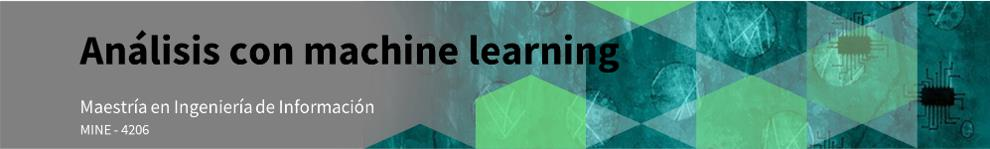

- **Integrante 1:** Julián Barreto Mora
- **Integrante 2:** Iván Saavedra Villamil
- **Integrante 3:** Julián Sanabria Mejia

## 0. Importación de Librerías

In [1]:
!pip install ydata-profiling
!pip install contractions

In [1]:
#Manejo de datos
import pandas as pd
import numpy as np

#Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import dump
%matplotlib inline

import re, string, unicodedata
import contractions
import inflect

#Analisis profundo de datos
from ydata_profiling import ProfileReport
from pandas_profiling import ProfileReport

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC


C:\Users\Julian\AppData\Local\Temp\ipykernel_12464\3742024142.py:17: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


## 1. Preparación de datos

Se carga los datos de tarjetas de crédito de Sempli

In [6]:
# data = pd.read_csv('./data/Sempli_data.csv')
data = pd.read_csv('./data/solicitudes_tc_dataset.csv', sep=";")
data

,contract_number,card_type,plastic_status,virtual_status,credit_limit,workflow_type,created_at,acquisition_channel,company_type,business_dni_type,...,sherlock_banked,sherlock_collection,emailage_eascore,lc_judicial_proceedings_against,number_shareholders,os,economic_activity_group,number_employees,mora_ultimos_6meses,moroso
0,17,BUSINESS,ACTIVE,ACTIVE,30000000.0,FAMILY_AND_FRIENDS,10/09/21 8:54,INTERNET,SAS,NIT,...,0.0,0.0,746.0,0.0,3.0,Windows,SERVICIOS,67.0,0.0,0.0
1,21,BUSINESS,CANCELED,CANCELED,10000000.0,FAMILY_AND_FRIENDS,10/09/21 15:35,COMMERCIAL_ALLY,SAS,NIT,...,0.0,0.0,580.0,0.0,6.0,Windows,SERVICIOS,42.0,102.0,1.0
2,9,BUSINESS,PENDING_ACTIVATION,ACTIVE,30000000.0,FAMILY_AND_FRIENDS,23/07/21 16:26,INTERNET,SAS,NIT,...,0.0,0.0,694.0,0.0,4.0,Windows,SERVICIOS,48.0,0.0,0.0
3,10,BUSINESS,ACTIVE,ACTIVE,30000000.0,FAMILY_AND_FRIENDS,23/07/21 11:56,INTERNET,SA,NIT,...,0.0,0.0,409.0,0.0,2.0,Windows,SERVICIOS,33.0,16.0,1.0
4,19,BUSINESS,ACTIVE,ACTIVE,20000000.0,FAMILY_AND_FRIENDS,10/09/21 10:19,FRIEND_OR_COLLEAGUE,SAS,NIT,...,0.0,0.0,385.0,0.0,2.0,Windows,SERVICIOS,80.0,5.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1706,2147,BUSINESS,ACTIVE,ACTIVE,5000000.0,CROSS_SELLING,16/03/23 16:02,REFERRER,SAS,NIT,...,0.0,0.0,438.0,0.0,2.0,Windows,MANUFACTURA,13.0,0.0,0.0
1707,2151,BUSINESS,ACTIVE,ACTIVE,30000000.0,FAMILY_AND_FRIENDS,21/03/23 14:01,INTERNET,SAS,NIT,...,0.0,0.0,284.0,0.0,2.0,Windows,SERVICIOS,28.0,0.0,0.0
1708,141,BUSINESS,SECURITY_LOCKED,SECURITY_LOCKED,10000000.0,FAMILY_AND_FRIENDS,28/10/21 14:23,FRIEND_OR_COLLEAGUE,SAS,NIT,...,0.0,0.0,368.0,0.0,2.0,Windows,MANUFACTURA,14.0,90.0,1.0
1709,2233,BUSINESS,PENDING_ACTIVATION,ACTIVE,10000000.0,FAMILY_AND_FRIENDS,20/04/23 14:00,REFERRER,SAS,NIT,...,0.0,0.0,605.0,0.0,7.0,Windows,SERVICIOS,11.0,0.0,0.0


Se dividen los datos en conjunto de entranamiento y pruebas

In [7]:
train, test = train_test_split(data, test_size=0.2, random_state=88)
train

,contract_number,card_type,plastic_status,virtual_status,credit_limit,workflow_type,created_at,acquisition_channel,company_type,business_dni_type,...,sherlock_banked,sherlock_collection,emailage_eascore,lc_judicial_proceedings_against,number_shareholders,os,economic_activity_group,number_employees,mora_ultimos_6meses,moroso
129,237,BUSINESS,SECURITY_LOCKED,SECURITY_LOCKED,10000000.0,CURRENT_CUSTOMER,18/11/21 18:28,FRIEND_OR_COLLEAGUE,SAS,NIT,...,0.0,0.0,520.0,0.0,2.0,Windows,SERVICIOS,9.0,80.0,1.0
1297,1914,BUSINESS,ACTIVE,ACTIVE,5000000.0,CROSS_SELLING,2/11/22 12:19,COMMERCIAL_ALLY,SAS,NIT,...,0.0,0.0,611.0,0.0,2.0,Windows,SERVICIOS,45.0,0.0,0.0
832,1285,BUSINESS,ACTIVE,ACTIVE,10000000.0,FAMILY_AND_FRIENDS,16/03/22 8:32,SOCIAL_NETWORKS,SAS,NIT,...,0.0,0.0,380.0,0.0,2.0,Windows,SERVICIOS,29.0,0.0,0.0
1501,2154,BUSINESS,PREVENTIVELY_LOCKED,PREVENTIVELY_LOCKED,10000000.0,FAMILY_AND_FRIENDS,23/03/23 7:58,EVENTS,SAS,NIT,...,0.0,0.0,486.0,0.0,1.0,Windows,SERVICIOS,77.0,0.0,0.0
782,1203,BUSINESS,PENDING_ACTIVATION,ACTIVE,2000000.0,FAMILY_AND_FRIENDS,2/03/22 10:54,FRIEND_OR_COLLEAGUE,SAS,NIT,...,0.0,0.0,331.0,0.0,4.0,Windows,SERVICIOS,32.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613,2041,BUSINESS,ACTIVE,ACTIVE,5000000.0,CROSS_SELLING,14/12/22 17:58,SOCIAL_NETWORKS,SAS,NIT,...,0.0,0.0,493.0,0.0,1.0,Windows,SERVICIOS,48.0,0.0,0.0
916,1455,BUSINESS,ACTIVE,ACTIVE,10000000.0,FAMILY_AND_FRIENDS,3/05/22 16:51,INTERNET,SAS,NIT,...,0.0,0.0,718.0,0.0,1.0,Windows,SERVICIOS,27.0,8.0,0.0
362,483,BUSINESS,ACTIVE,ACTIVE,10000000.0,BUSINESS,14/12/21 15:44,SOCIAL_NETWORKS,SAS,NIT,...,1.0,1.0,534.0,0.0,1.0,Windows,SERVICIOS,11.0,13.0,0.0
433,806,BUSINESS,ACTIVE,ACTIVE,10000000.0,BUSINESS,21/12/21 15:06,SOCIAL_NETWORKS,SAS,NIT,...,0.0,1.0,485.0,0.0,1.0,Linux,SERVICIOS,1.0,90.0,1.0


Se realiza un análisis exploratorio sobre el conjunto de entrenamiento

In [8]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Se toma la decisión de descartar las variables id, contract_number, plastic_status, virtual_status, sempli_score, workflow_id, status, rejection_reason, created_at, business_website, city, sherlock_line_start_date, emailage_ipaddress, emailage_ipcity, emailage_ipcountry, os, economic_activity_description, mora_ultimos_6meses

In [ ]:
card_type, credit_limit, workflow_type, acquisition_channel, business_dni_type, department, bureau_type

company_type             -> 26% nulos
employees_range          -> 75% nulos
number_employees         -> 79%
business_foundation_year -> 29% nulos
economic_activity        -> 34% nulos
bureau_mean_age          -> 86% nulos
bureau_score             -> 66% nulos
banked_type1             -> 65% nulos -> boolean (los pasamos a cero?)
banked_type2             -> 64% nulos -> boolean (los pasamos a cero?)
hard_credit_check        -> 73% nulos
number_saving_accounts   -> 64% nulos
number_saving_accounts_alert -> 64% nulos
bureau_debt             -> 69% nulos -> numérico -> los nulos los pasamos a cero?
bureau_debt_default     -> 69% nulos -> numérico -> los nulos los pasamos a cero?
number_current_loans    -> 69% nulos -> numérico -> los nulos los pasamos a cero?
number_current_loans_default -> 69% nulos -> numérico -> los nulos los pasamos a cero?
max_vector_24m          -> 69% nulos -> numérico -> podemos imputar por algún valor?
current_vector          -> 69% nulos -> numérico -> podemos imputar por algún valor?
max_vector_3m           -> 69% nulos -> numérico -> podemos imputar por algún valor?
max_vector_6m           -> 69% nulos -> numérico -> podemos imputar por algún valor?
max_vector_12m          -> 69% nulos -> numérico -> podemos imputar por algún valor?
sherlock_anomaly        -> 70% nulos -> numérico -> podemos imputar por algún valor?
sherlock_distrust       -> 70% nulos -> numérico -> podemos imputar por algún valor?
sherlock_operator       -> 70% nulos -> numérico -> podemos imputar por algún valor?
sherlock_line_state     -> 70% nulos -> numérico -> podemos imputar por algún valor?
sherlock_reactivate     -> 72% nulos -> numérico -> podemos imputar por algún valor?
sherlock_banked         -> 72% nulos -> numérico -> podemos imputar por algún valor?
sherlock_collection     -> 72% nulos -> numérico -> podemos imputar por algún valor?
sherlock_collection_perc-> 72% nulos -> numérico -> podemos imputar por algún valor?
sherlock_collection_no_telcos_perc-> 72% nulos -> numérico -> podemos imputar por algún valor?
emailage_ipregion       -> 70% nulos -> categorico -> podemos imputar por algún valor?
emailage_eascore        -> 70% nulos -> numérico -> podemos imputar por algún valor?
credit_study_income     -> 64% nulos -> numérico -> podemos imputar por algún valor?
nboarding_income        -> 64% nulos -> numérico -> podemos imputar por algún valor?
dian_income             -> 65% nulos -> numérico -> podemos imputar por algún valor?
lc_judicial_proceedings_against -> 43% nulos -> numérico -> podemos imputar por algún valor?
number_shareholders     -> 26% nulos -> numérico -> podemos imputar por algún valor?
tier                    -> 64% nulos -> numérico -> podemos imputar por algún valor?
economic_activity_group -> 35% nulos -> categorico -> podemos imputar por algún valor?

In [ ]:
Variable objetico moroso -> 3.1% nulos

## 2. Modelamiento

### 2.1. Perceptron Multicapa

### 2.2. Red Neuronal Convolucional Propia

#### 2.2.1. Entrenamiento Modelo Base

In [130]:
with tf.device('/device:GPU:0'):
    history_DCN_LB = model_DCN_LB.fit(train_ds,
        validation_data=val_ds,
        epochs=50,
        callbacks=my_callbacks
    )

Epoch 1/50
100/100 [==============================] - 57s 570ms/step - loss: 0.9926 - precision_7: 0.7232 - recall_7: 0.3613 - val_loss: 1.5089 - val_precision_7: 0.3680 - val_recall_7: 0.2215
Epoch 2/50
100/100 [==============================] - 58s 582ms/step - loss: 0.8876 - precision_7: 0.7460 - recall_7: 0.4529 - val_loss: 1.5878 - val_precision_7: 0.3966 - val_recall_7: 0.2879
Epoch 3/50
100/100 [==============================] - 55s 554ms/step - loss: 0.8652 - precision_7: 0.7616 - recall_7: 0.4836 - val_loss: 1.4812 - val_precision_7: 0.3992 - val_recall_7: 0.2353
Epoch 4/50
100/100 [==============================] - 56s 555ms/step - loss: 0.7813 - precision_7: 0.7881 - recall_7: 0.5618 - val_loss: 1.5352 - val_precision_7: 0.4076 - val_recall_7: 0.2678
Epoch 5/50
100/100 [==============================] - 55s 547ms/step - loss: 0.5732 - precision_7: 0.8551 - recall_7: 0.7013 - val_loss: 1.7226 - val_precision_7: 0.4173 - val_recall_7: 0.3254
Epoch 6/50
100/100 [===============

#### 2.2.2. Predicción Modelo Base

#### 2.2.3. Búsqueda de Mejor Modelo DCN

#### 2.2.4. Predicción Mejor Modelo

#### 2.2.5. Reducción Dimensionalidad Imágenes

#### 2.2.6. Entrenamiento Modelo Base luego de la Reducción Dimensionalidad

#### 2.2.7. Predicción Modelo Base Reducción Dimensionalidad

#### 2.2.8. Busqueda Mejor Modelo Reducción Dimensionalidad

#### 2.2.9. Predicción Mejor Modelo Reducción Dimensionalidad

#### 2.2.10. Conclusiones Red Neuroral Convolucional

### 2.3. Red Neuronal con Transferencia de Conocimiento